In [ ]:
today_date = date.today() - timedelta(minutes=1440)
yesterday_date = date.today() - timedelta(minutes=2880)
api = openaq.OpenAQ()
df = api.latest(df = True)
data = api.measurements(city='Delhi',parameter='pm25',date_from=yesterday_date,
                                date_to = today_date,df=True)
print("--analysing the data--")
X = data[['coordinates.longitude','coordinates.latitude']]
Y = data[['value']]

--analysing the data--


  Created wheel for py-openaq: filename=py_openaq-1.1.0-py3-none-any.whl size=9037 sha256=5933f6a4a2a0325d3f5c764345cd3c7da4e7a2ca38389dcda6f118833bddda1c
  Stored in directory: /root/.cache/pip/wheels/b7/64/46/caec8d415716f8ebeb1e95f11d8c83aff852f41ab6eb1dc98f
Successfully built py-openaq
     |████████████████████████████████| 734 kB 9.2 MB/s 
     |████████████████████████████████| 93 kB 1.9 MB/s 
     |████████████████████████████████| 1.0 MB 16.9 MB/s 
     |████████████████████████████████| 10.3 MB 36.9 MB/s 
     |████████████████████████████████| 6.3 MB 27.9 MB/s 
     |████████████████████████████████| 994 kB 48.6 MB/s 
     |████████████████████████████████| 62 kB 532 kB/s 
     |████████████████████████████████| 15.4 MB 39 kB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
  

     |████████████████████████████████| 13.1 MB 97 kB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.4.3
    Uninstalling matplotlib-3.4.3:
      Successfully uninstalled matplotlib-3.4.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
osmnx 1.1.1 requires matplotlib>=3.3, but you have matplotlib 3.1.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


--Setting map--
--importing data--
--analysing the data--
--running model--


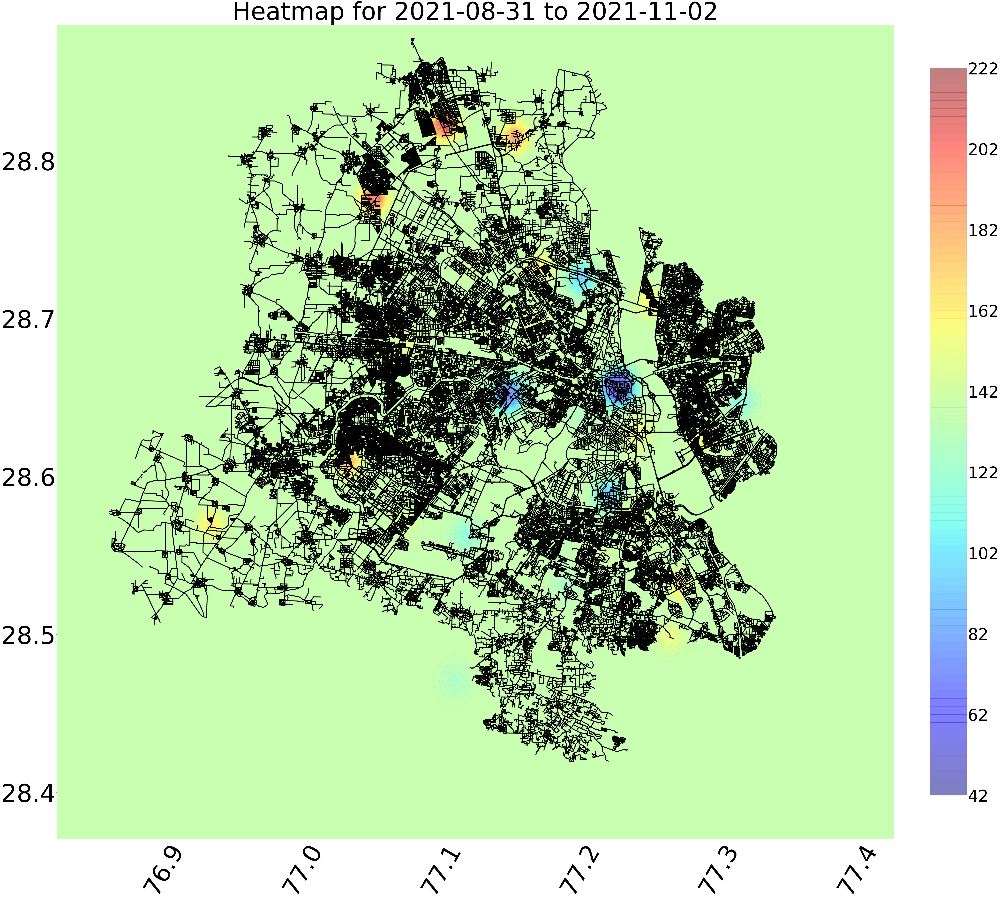

In [ ]:
!pip install py-openaq
!pip install pykrige
!pip install osmnx
!pip install schedule
!pip install matplotlib==3.1.3
import openaq
import numpy as np
import osmnx as ox
import matplotlib.pyplot as plt
get_ipython().run_line_magic('matplotlib', 'inline') 
from datetime import datetime
from datetime import date
from datetime import timedelta
import warnings
warnings.filterwarnings('ignore')
import schedule
import pykrige.kriging_tools as kt
from pykrige.kriging_tools import write_asc_grid
from pykrige.ok import OrdinaryKriging
import glob
import geopandas as gpd
import time

def analyse_and_export():
    print("--Setting map--")
    state = ox.graph_from_place({'state':'Delhi', 'country':'India'},network_type='drive')
    nodes,edges = ox.graph_to_gdfs(state)
    
    print("--importing data--")
    #today_date = date.today() - timedelta(minutes=1440)
    #yesterday_date = date.today() - timedelta(minutes=2880)
    old_d = date(2021,8,31)
    old_d_2 = date(2021,11,2)
    #new_d = date(2021,11,3)
    #new_d_2 = = date(2021,11,5)
    api = openaq.OpenAQ()
    df = api.latest(df = True)
    data = api.measurements(city='Delhi',parameter='pm25',date_from=old_d,
                                date_to = old_d_2,df=True)
    print("--analysing the data--")
    X = data[['coordinates.longitude','coordinates.latitude']]
    Y = data[['value']]
    X = X.values
    Y = Y.values
    Y[Y <=  0] = Y.mean()
    xmin = 76.8225413
    xmax = 77.426032
    ymin = 28.3706914
    ymax = 28.8862

    grid_lon = np.linspace(xmin, xmax, 100)
    grid_lat = np.linspace(ymin, ymax, 100)
    Y = np.log(Y)
    print("--running model--")
    OK = OrdinaryKriging(X[:,0],X[:,1],Y, variogram_model='gaussian',
                      enable_plotting=False,nlags=20) 
    z_gate, ss_gate = OK.execute('grid', grid_lon, grid_lat)
    #print (z_gate)
    z_gate = np.exp(z_gate)
    xintrp, yintrp = np.meshgrid(grid_lon, grid_lat) 
    fig, ax = plt.subplots(figsize=(100,100))

    contour = plt.contourf(xintrp, yintrp, z_gate,len(z_gate),cmap=plt.cm.jet,alpha = 0.5) 
    plt.colorbar(contour,fraction=0.04, pad=0.04)
    contour.colorbar.ax.tick_params(labelsize = 100)
    edges.plot(ax = ax ,alpha=1,linewidth=5.5,edgecolor='black',zorder=5)
    plt.xticks(fontsize = 150, rotation=60)
    plt.yticks(fontsize = 150)
    plt.title('Heatmap for '+str(old_d)+' to '+str(old_d_2),fontsize = 150)
    plt.show()
analyse_and_export()

In [ ]:
X = X.values
Y = Y.values
Y[Y <=  0] = Y.mean()

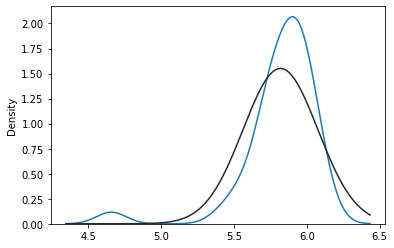

In [ ]:
# !pip install seaborn
import seaborn as sns
from scipy.stats import norm
sns.distplot(np.log(Y), hist=False, fit=norm)
plt.show()

--Setting map--
--importing data--
--analysing the data--
--running model--


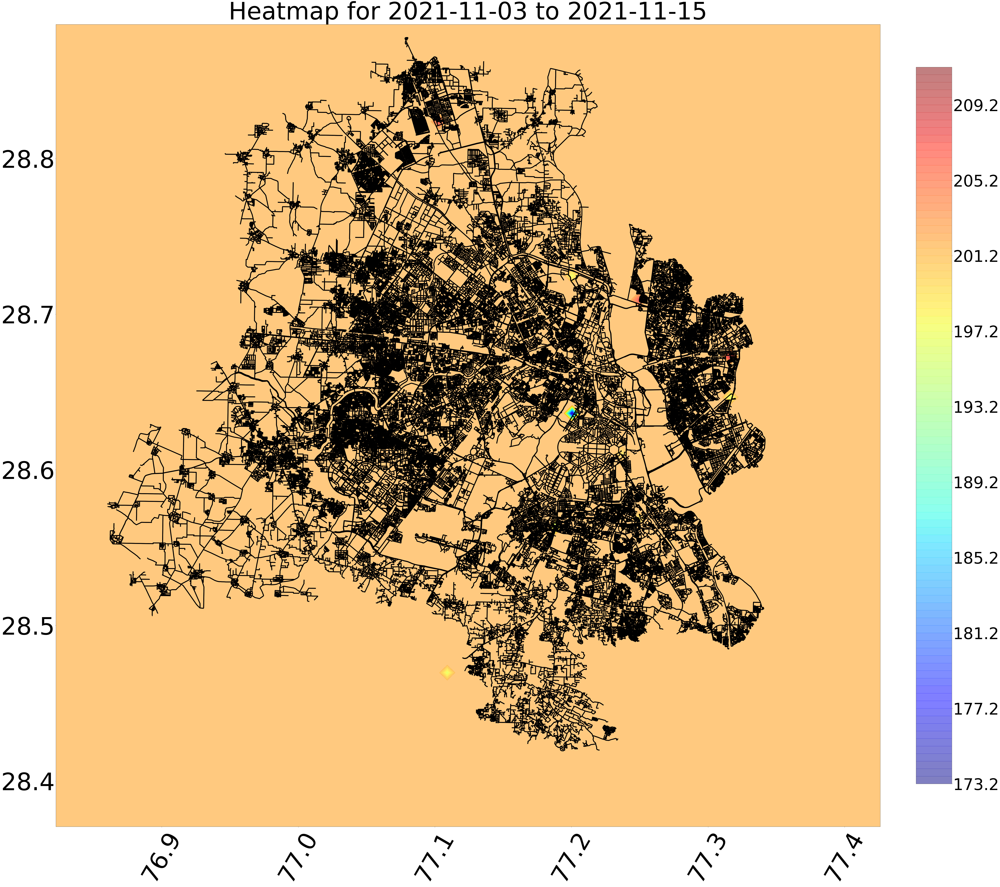

In [ ]:
import openaq
import numpy as np
import osmnx as ox
import matplotlib.pyplot as plt
get_ipython().run_line_magic('matplotlib', 'inline')
from datetime import datetime
from datetime import date
from datetime import timedelta
import warnings
warnings.filterwarnings('ignore')
import schedule
import pykrige.kriging_tools as kt
from pykrige.kriging_tools import write_asc_grid
from pykrige.ok import OrdinaryKriging
import glob
import geopandas as gpd
import time

def analyse_and_export():
    print("--Setting map--")
    state = ox.graph_from_place({'state':'Delhi', 'country':'India'},network_type='drive')
    nodes,edges = ox.graph_to_gdfs(state)
    
    print("--importing data--")
    #today_date = date.today() - timedelta(minutes=1440)
    #yesterday_date = date.today() - timedelta(minutes=2880)
    #old_d = date(2021,8,31)
    #old_d_2 = date(2021,9,2)
    new_d = date(2021,11,3)
    new_d_2 = date(2021,11,15)
    api = openaq.OpenAQ()
    df = api.latest(df = True)
    data = api.measurements(city='Delhi',parameter='pm25',date_from=new_d,
                                date_to = new_d_2,df=True)
    print("--analysing the data--")
    X = data[['coordinates.longitude','coordinates.latitude']]
    Y = data[['value']]
    X = X.values
    Y = Y.values
    Y[Y <=  0] = Y.mean()
    xmin = 76.8225413
    xmax = 77.426032
    ymin = 28.3706914
    ymax = 28.8862

    grid_lon = np.linspace(xmin, xmax, 100)
    grid_lat = np.linspace(ymin, ymax, 100)
    Y = np.log(Y)
    print("--running model--")
    OK = OrdinaryKriging(X[:,0],X[:,1],Y, variogram_model='gaussian',
                      enable_plotting=False,nlags=20)
    z_gate, ss_gate = OK.execute('grid', grid_lon, grid_lat)
    #print (z_gate)
    z_gate = np.exp(z_gate)
    xintrp, yintrp = np.meshgrid(grid_lon, grid_lat) 
    fig, ax = plt.subplots(figsize=(100,100))

    contour = plt.contourf(xintrp, yintrp, z_gate,len(z_gate),cmap=plt.cm.jet,alpha = 0.5) 
    plt.colorbar(contour,fraction=0.04, pad=0.04)#cax=cax)
    contour.colorbar.ax.tick_params(labelsize = 100)
    edges.plot(ax = ax ,alpha=1,linewidth=5.5,edgecolor='black',zorder=5)
    plt.xticks(fontsize = 150, rotation=60)
    plt.yticks(fontsize = 150)
    plt.title('Heatmap for '+str(new_d)+' to '+str(new_d_2),fontsize = 150)
    plt.show()
analyse_and_export()